## VISUALIZE
- A Jupyter notebook to help display the inputs of the model as well as it's weights

In [1]:
from game import Game
from agent import PongAgent
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import math

# Define your model architecture
def build_model():
    p = PongAgent(0, 1)
    return p.model

pygame 2.6.0 (SDL 2.28.4, Python 3.11.5)
Hello from the pygame community. https://www.pygame.org/contribute.html


2024-08-18 21:35:26.920439: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-08-18 21:35:26.963268: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-18 21:35:26.986864: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-18 21:35:26.992288: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-18 21:35:27.028743: I tensorflow/core/platform/cpu_feature_guar

## Display model inputs:

- The model takes in a 280 x 120 grid of pixels.
- The color values encode things like velocity and object type.
- We can display the model's inputs over time as a video

In [2]:
s = Game(**{'obstacles':2, 'jupyter':1, 'nn':0, 'vision':True})

p1_list = []
p2_list = []
for _ in range(200):
    ns = s.step({'p1':0,'p2':0})
    p1_list.append(s.get_state())
    p2_list.append(s.get_state(1))
s.end()


ALSA lib confmisc.c:855:(parse_card) cannot find card '0'
ALSA lib conf.c:5178:(_snd_config_evaluate) function snd_func_card_inum returned error: No such file or directory
ALSA lib confmisc.c:422:(snd_func_concat) error evaluating strings
ALSA lib conf.c:5178:(_snd_config_evaluate) function snd_func_concat returned error: No such file or directory
ALSA lib confmisc.c:1334:(snd_func_refer) error evaluating name
ALSA lib conf.c:5178:(_snd_config_evaluate) function snd_func_refer returned error: No such file or directory
ALSA lib conf.c:5701:(snd_config_expand) Evaluate error: No such file or directory
ALSA lib pcm.c:2664:(snd_pcm_open_noupdate) Unknown PCM default


### P1 Perspective

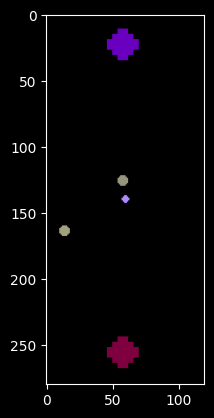

In [3]:
fig, ax = plt.subplots()
img_display = ax.imshow(p1_list[0][0])
def update_frame(i):
    img_display.set_data(p1_list[i][0])
    return [img_display]
ani = animation.FuncAnimation(fig, update_frame, frames=len(p1_list), interval=1)
HTML(ani.to_jshtml())

### P2 Perspective

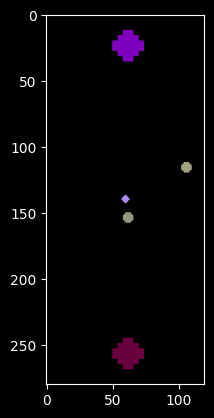

In [4]:
fig, ax = plt.subplots()
img_display = ax.imshow(p2_list[0][0])
def update_frame(i):
    img_display.set_data(p2_list[i][0])
    return [img_display]
ani = animation.FuncAnimation(fig, update_frame, frames=len(p2_list), interval=1)
HTML(ani.to_jshtml())

## Visualize model weights
- For convolutional layers we can display the weights as color images for each of the dimensions
- For dense layers we can plot the weights mapping to the next layer's neurons as an image

/home/quimbo/miniconda3/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1724031338.097475 3959239 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1724031338.097719 3959239 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1724031338.097746 3959239 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1724031338.266459 3959239 cuda_execu

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                               ┃ Output Shape                    ┃           Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ conv3d (Conv3D)                            │ (None, 40, 40, 3, 128)          │            58,880 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ max_pooling3d (MaxPooling3D)               │ (None, 38, 38, 3, 128)          │                 0 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ dropout (Dropout)                          │ (None, 38, 38, 3, 128)          │                 0 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ conv3d_1 (Conv3D)                          │ (None, 19, 19, 3, 256)          │         4,817,152 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ max_pooling3d_1 (MaxPooling3D)             │ (None, 9, 9, 3, 256)            │                 0 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ dropout_1 (Dropout)                        │ (None, 9, 9, 3, 256)            │                 0 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ conv3d_2 (Conv3D)                          │ (None, 5, 5, 3, 128)            │           884,864 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ max_pooling3d_2 (MaxPooling3D)             │ (None, 3, 3, 3, 128)            │                 0 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ dropout_2 (Dropout)                        │ (None, 3, 3, 3, 128)            │                 0 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ flatten (Flatten)                          │ (None, 3456)                    │                 0 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ dense (Dense)                              │ (None, 2048)                    │         7,079,936 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ dropout_3 (Dropout)                        │ (None, 2048)                    │                 0 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ dense_1 (Dense)                            │ (None, 512)                     │         1,049,088 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ dropout_4 (Dropout)                        │ (None, 512)                     │                 0 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ dense_2 (Dense)                            │ (None, 128)                     │            65,664 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ dropout_5 (Dropout)                        │ (None, 128)                     │                 0 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ dense_3 (Dense)                            │ (None, 5)                       │               645 │
└────────────────────────────────────────────┴─────────────────────────────────┴───────────────────┘

 Total params: 13,956,229 (53.24 MB)

 Trainable params: 13,956,229 (53.24 MB)

 Non-trainable params: 0 (0.00 B)

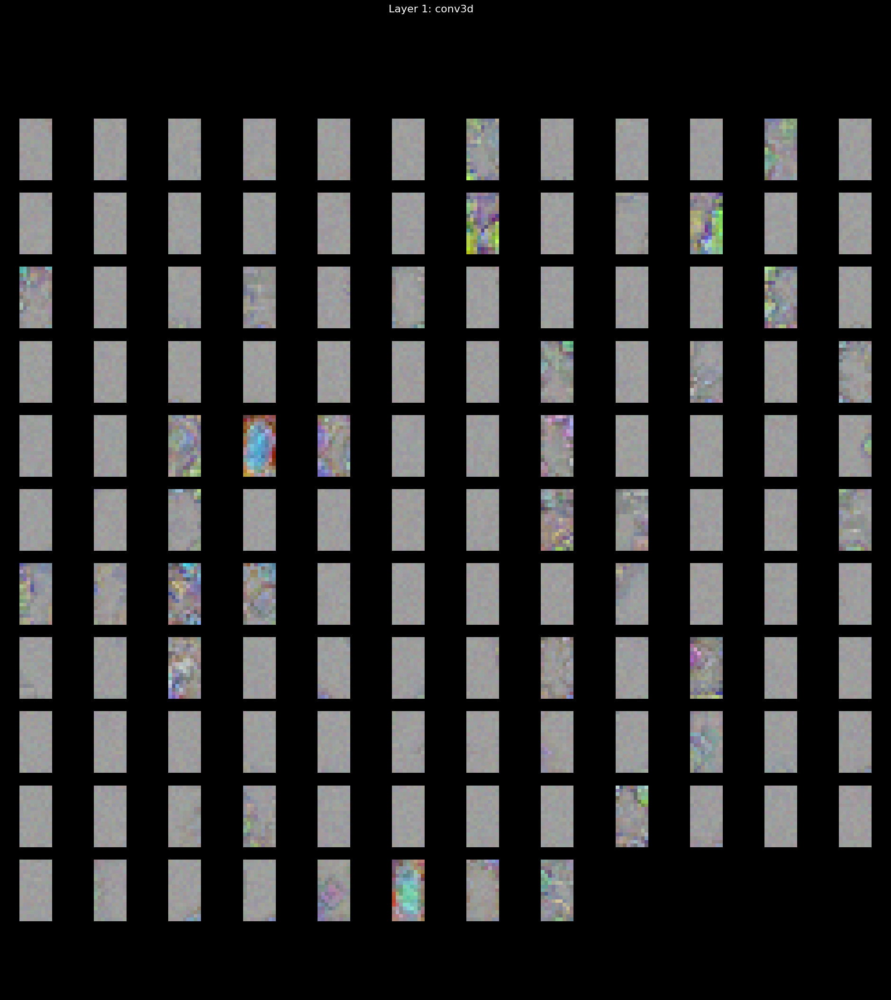

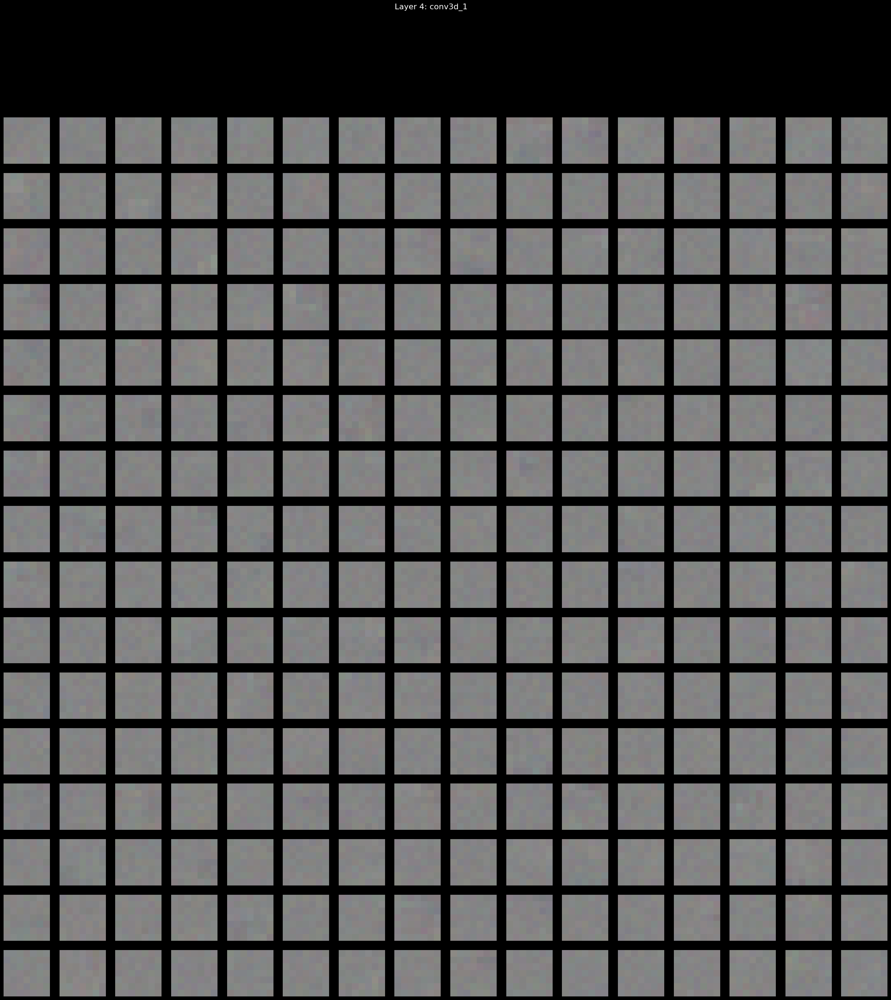

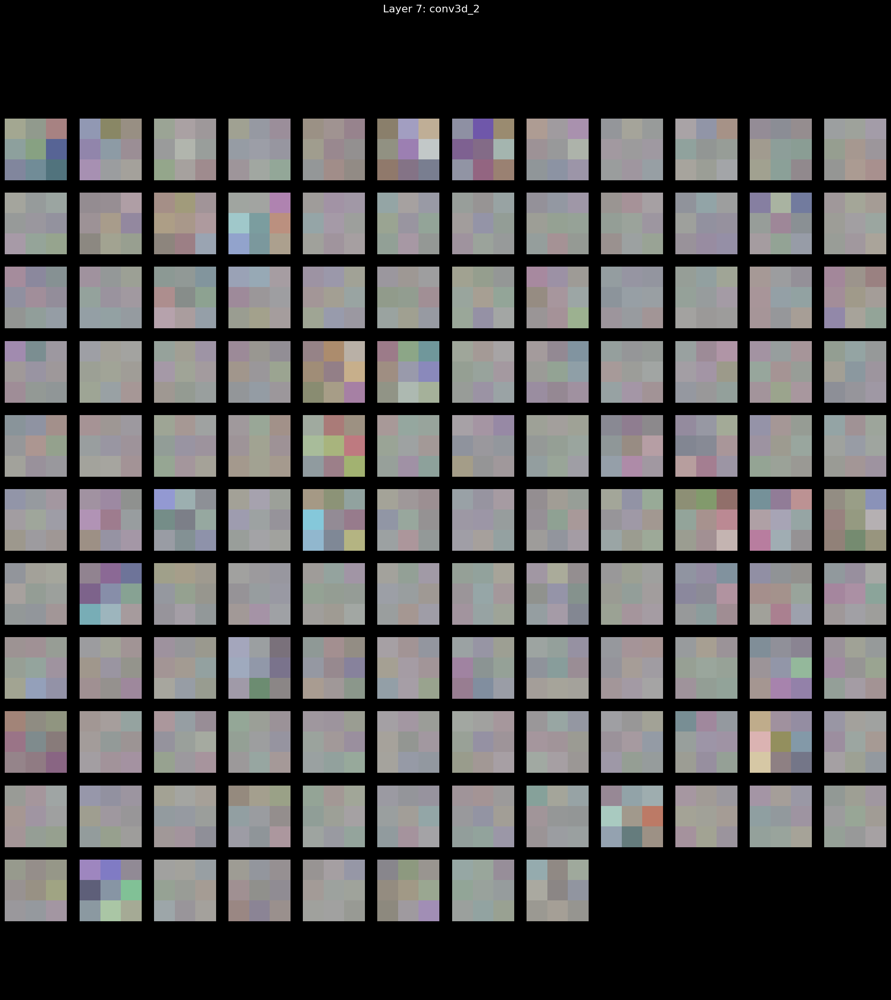

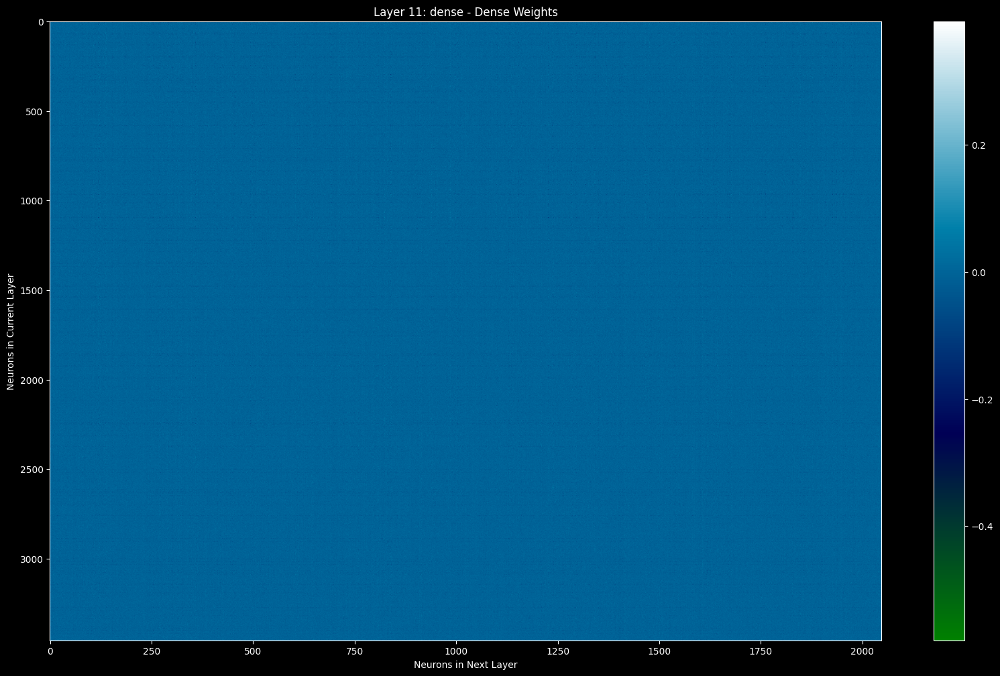

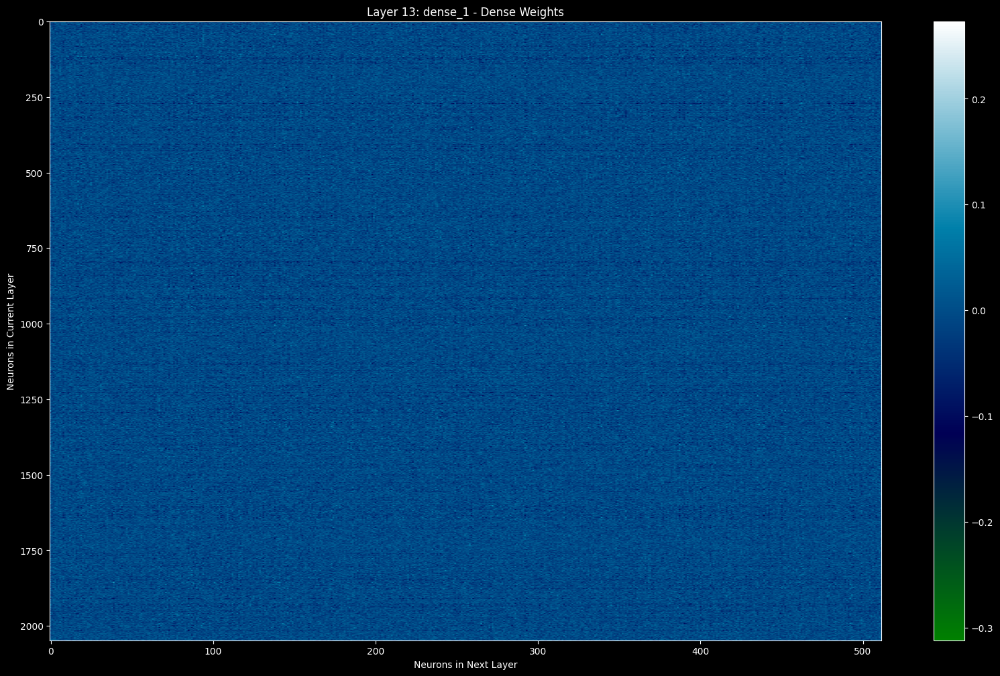

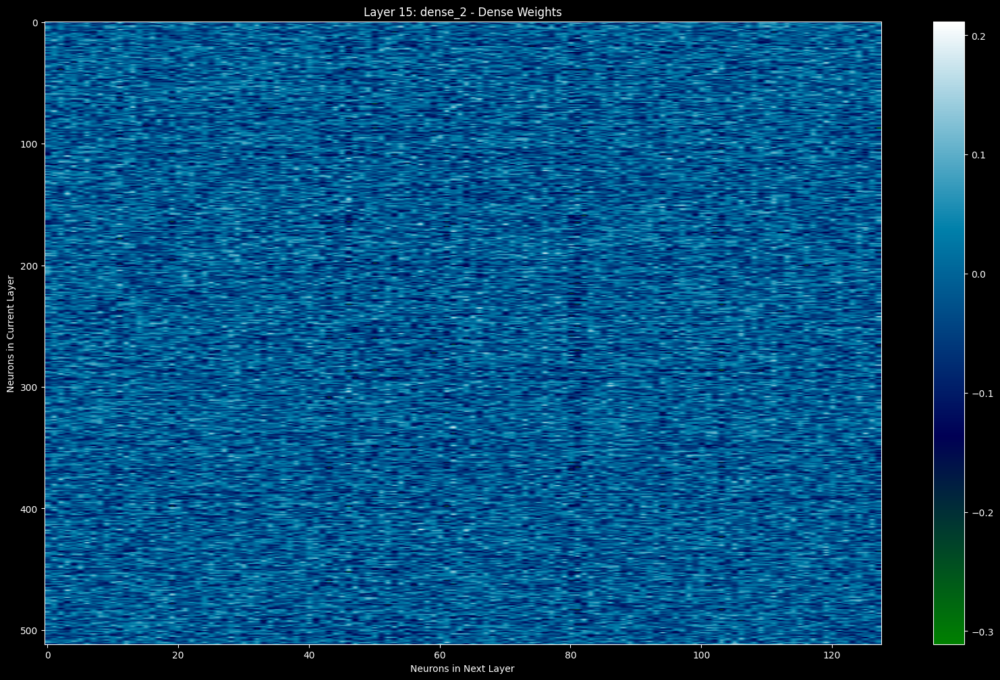

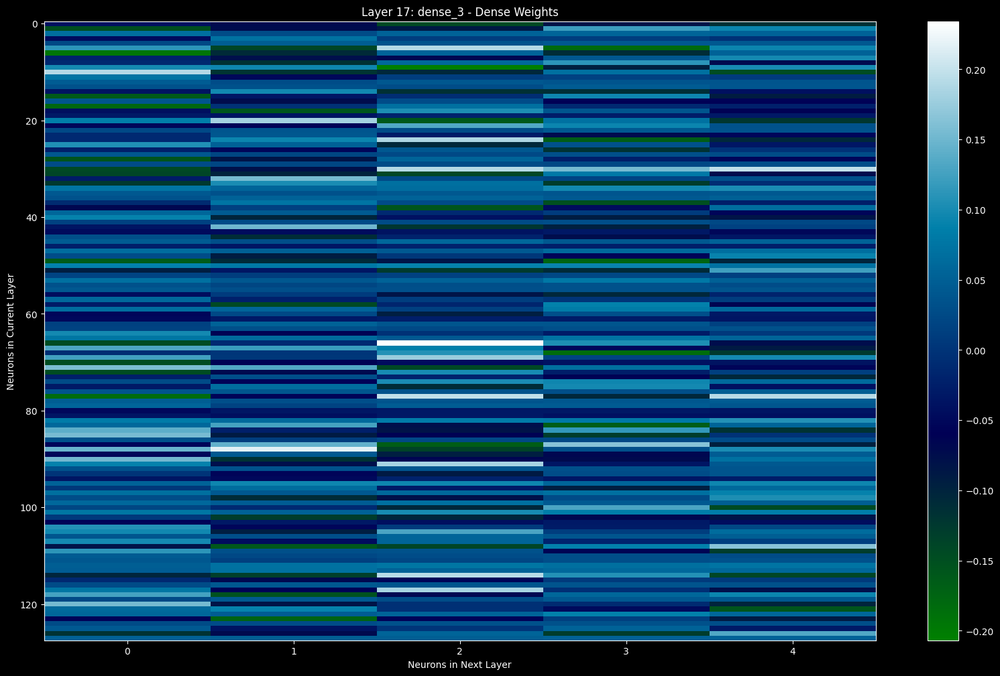

In [2]:
model = build_model()
model.load_weights('./models/pong_agent.h5')

for layer_idx, layer in enumerate(model.layers):        
    if 'conv' in layer.name:
        filters, biases = layer.get_weights()
        filters = (filters - filters.min()) / (filters.max() - filters.min())
        num_filters = filters.shape[-1]
        grid_size = math.ceil(math.sqrt(num_filters))

        fig, axes = plt.subplots(grid_size, grid_size, figsize=(grid_size * 2, grid_size * 2))
        fig.suptitle(f'Layer {layer_idx + 1}: {layer.name}', fontsize=16)
        
        for i in range(grid_size * grid_size):
            row, col = divmod(i, grid_size)
            ax = axes[row, col] if grid_size > 1 else axes
            
            if i < num_filters:
                kernel = filters[..., i]

                if kernel.shape[-1] == 3:
                    for j in range(3):
                        ax.imshow(kernel[..., j])
                        ax.axis('off')
                else:
                    ax.imshow(kernel[..., 0])
                    ax.axis('off')
            else:
                ax.axis('off')
        plt.show()

    if 'dense' in layer.name:
        weights, biases = layer.get_weights()

        plt.figure(figsize=(20, 12))
        plt.imshow(weights, aspect='auto', cmap='ocean')
        plt.colorbar()
        plt.title(f'Layer {layer_idx + 1}: {layer.name} - Dense Weights')
        plt.xlabel('Neurons in Next Layer')
        plt.ylabel('Neurons in Current Layer')
        plt.show()